In [1]:
using Pkg

Pkg.activate(".")
Pkg.instantiate()
Pkg.status()

#=
Pkg.add(
["QuantumOptics","Flux", "ProgressMeter", "Random", 
"Statistics", "SparseArrays", "Zygote", "LinearAlgebra", 
"StatsBase","DiffEqFlux","Optimisers","Compat",
"PlotlyJS","DataFrames", "CSV","BSON", "Revise", "DelimitedFiles"]
)
=#

##########################################
#= Packages =#
using Flux, ProgressMeter, Random, Statistics, QuantumOptics, SparseArrays, StatsBase, LinearAlgebra, Revise
using Zygote, DifferentialEquations, SciMLSensitivity, DiffEqFlux, Optimisers, Compat, PlotlyJS, CSV, DataFrames, BSON
using Distributions, BSplineKit, DelimitedFiles
##########################################

  Activating project at `c:\Users\dstir\Desktop\GitHub\NN_QM\HBAR-qubit_problem`


Status `C:\Users\dstir\Desktop\GitHub\NN_QM\HBAR-qubit_problem\Project.toml`
  [fbb218c0] BSON v0.3.9
  [093aae92] BSplineKit v0.19.0
  [336ed68f] CSV v0.10.15
⌃ [34da2185] Compat v4.16.0
  [a93c6f00] DataFrames v1.7.0
  [8bb1440f] DelimitedFiles v1.9.1
⌃ [aae7a2af] DiffEqFlux v4.3.0
  [0c46a032] DifferentialEquations v7.16.1
  [31c24e10] Distributions v0.25.120
⌃ [587475ba] Flux v0.16.3
  [3bd65402] Optimisers v0.4.6
  [f0f68f2c] PlotlyJS v0.18.16
  [92933f4c] ProgressMeter v1.10.4
  [6e0679c1] QuantumOptics v1.2.3
  [295af30f] Revise v3.8.0
⌃ [1ed8b502] SciMLSensitivity v7.79.0
  [2913bbd2] StatsBase v0.34.5
⌃ [e88e6eb3] Zygote v0.7.7
  [37e2e46d] LinearAlgebra
  [9a3f8284] Random
  [2f01184e] SparseArrays v1.10.0
  [10745b16] Statistics v1.10.0
Info Packages marked with ⌃ have new versions available and may be upgradable.


# 02.11.25
# three-output NN -> $ \tau_\mathrm{sf}, \omega_\mathrm{drive}, \tau_\mathrm{swap}$

In [38]:
################################################
  #= PRELIMINARY DEFINITIONS AND DYNAMICS =#
################################################
N_mech = 15; #Cut-off Fock basis for the mech resonator
dimension = 2 * (N_mech+1); #Ket state vector's dimension

#####################################################################################
#BSpline definition
degree_spline = 3            # spline order (cubic spline)
n_basis_spline = 5         # number of basis functions
domain_spline = (0.0, 1.0);  # interval for the spline
#####################################################################################

(0.0, 1.0)

In [2]:
include("../definitions.jl")

In [39]:
Δ0 = 1.0
include("HBAR-qubit_problem.jl")
include("../ML_QM_library.jl")

execute_problem_NN (generic function with 1 method)

In [40]:
SUN_basis = rand_hermitian_orthonormal_basis(dimension, basis);

# Warm-up

In [ ]:
#=
N_steps = 1
# Set seed for reproducibility
Random.seed!(42)

type_of_problem = :FL_1step_3p
type_of_dynamics = :schroedinger_dynamic

function execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    infidelities = []
    predictions = []
    models = []
    final_states = []


    n_pulses = 2 #for each step
    n_input, n_output = (dimension^2) + n_pulses, n_pulses + 1

    type_of_correction = :correction_off
    norm_dataset = :normalized

    #= Dynamic features and initial conditions =#
    t0 = 0.0
    ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))
    n_phonon = 0
    
    #= dimension of training+testing dataset =#
    n_samples = 500
    n_training = 475


    #= probability distribution for sampling parameters space =#
    dim_x, dim_y, dim_z = 1e2, 1e2, 1e2
    prs(x,y,z) = 1 / (dim_x * dim_y * dim_z)

    for step in 1:N_steps

        #= Physical parameters =#
        T_exc_ini, T_exc_fin = π, 1e-1 * Δ0

        δ0 = 1; δ = 100 / Δ0
        δ0_ini, δ0_fin = δ0 -δ , δ0+δ;

        t_swap_th = (π) / (2*g*sqrt(step)); δ1 = 0.0005 * Δ0 / sqrt(step); δ2 = 0.005 * Δ0;
        T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2;


        #= Features (see definitions.jl for further information) =#
        Step_states = creation_step_states(
            ψ0,
            step
        )

        FL_1step_features = fl_1step_features(
            Step_states.ψ_target_spinflip,
            Step_states.ψ_target_1step, 
            SUN_basis, 
            n_phonon, 
            type_of_correction
        )


        Dataset_features = dataset_features(
            type_of_problem, 
            [n_samples, n_training],
            [n_input, n_output], 
            [dim_x, dim_y, dim_z], 
            [[T_exc_ini, T_exc_fin], [δ0_ini, δ0_fin], [T_SWAP_ini, T_SWAP_fin]], 
            prs,  
            type_of_dynamics, 
            t0, 
            Step_states.ψ0,
            FL_1step_features,
            ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
            :generating,
            norm_dataset
        )

        ###############################################################################
        #= NN =#

        #= Main features =#
        η = 0.0001
        N_epochs = 200


        #= Model_input =#
        # Define neural network model
        model = Flux.f64(
            Flux.Chain(
            Flux.Dense(n_input, 500, relu),
            Flux.Dense(500, n_output),
            Flux.softplus
            )
        )

        target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
        NN_features = fl_1step_nn_features_(
            model,
            N_epochs,
            η,
            Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
            target_input_1step,
            [Dataset_features.t0, Step_states.ψ0, target_input_1step, Step_states.ψ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
            :mse,
            :prediction_infidelity
        )

        #= EXECUTE ALGORITHM =#
        dataset_vector, time, final_state, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);


        #= Updating initial conditions =#
        t0, ψ0, n_phonon = t0 + (time[1] + time[3]), final_state, step



        push!(infidelities, infidelity_prediction)
        push!(predictions, time)
        push!(models, model)
        push!(final_states, final_state)
    end
    
    return SUN_basis, infidelities, predictions, models, final_states
end

data11, data21, data31, data41, data51 = execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps);
=#

# Unitary

In [ ]:
N_steps = 2
# Set seed for reproducibility
Random.seed!(42)

type_of_problem = :FL_1step_3p
type_of_dynamics = :schroedinger_dynamic

function execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    infidelities = []
    predictions = []
    models = []
    final_states = []


    n_pulses = 2 #for each step
    n_input, n_output = (dimension^2) + n_pulses, n_pulses + 1

    type_of_correction = :correction_off
    norm_dataset = :normalized

    #= Dynamic features and initial conditions =#
    t0 = 0.0
    ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))
    n_phonon = 0
    
    #= dimension of training+testing dataset =#
    n_samples = 300
    n_training = 275


    #= probability distribution for sampling parameters space =#
    dim_x, dim_y, dim_z = 5e3, 5e3, 5e3
    prs(x,y,z) = 1 / (dim_x * dim_y * dim_z)

    for step in 1:N_steps

        #= Physical parameters =#
        T_exc_ini, T_exc_fin = π, 1e-1 * Δ0

        δ0 = 1; δ = 100 / Δ0
        δ0_ini, δ0_fin = δ0 -δ , δ0+δ;

        t_swap_th = (π) / (2*g*sqrt(step)); δ1 = 0.0005 * Δ0 / sqrt(step); δ2 = 0.005 * Δ0;
        T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2;


        #= Features (see definitions.jl for further information) =#
        Step_states = creation_step_states(
            ψ0,
            step
        )

        FL_1step_features = fl_1step_features(
            Step_states.ψ_target_spinflip,
            Step_states.ψ_target_1step, 
            SUN_basis, 
            n_phonon, 
            type_of_correction
        )


        Dataset_features = dataset_features(
            type_of_problem, 
            [n_samples, n_training],
            [n_input, n_output], 
            [dim_x, dim_y, dim_z], 
            [[T_exc_ini, T_exc_fin], [δ0_ini, δ0_fin], [T_SWAP_ini, T_SWAP_fin]], 
            prs,  
            type_of_dynamics, 
            t0, 
            Step_states.ψ0,
            FL_1step_features,
            ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
            :generating,
            norm_dataset
        )

        ###############################################################################
        #= NN =#

        #= Main features =#
        η = 0.0001
        N_epochs = 200


        #= Model_input =#
        # Define neural network model
        model = Flux.f64(
            Flux.Chain(
            Flux.Dense(n_input, 500, relu),
            Flux.Dense(500, n_output),
            Flux.softplus
            )
        )

        target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
        NN_features = fl_1step_nn_features_(
            model,
            N_epochs,
            η,
            Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
            target_input_1step,
            [Dataset_features.t0, Step_states.ψ0, target_input_1step, Step_states.ψ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
            :mse,
            :prediction_infidelity
        )

        #= EXECUTE ALGORITHM =#
        dataset_vector, time, final_state, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);


        #= Updating initial conditions =#
        t0, ψ0, n_phonon = t0 + (time[1] + time[3]), final_state, step



        push!(infidelities, infidelity_prediction)
        push!(predictions, time)
        push!(models, model)
        push!(final_states, final_state)
    end
    
    return SUN_basis, infidelities, predictions, models, final_states
end



data_unitary = []
r = [0.1, 0.5]
g = 258 #KHz

for rs in r
    global Δ0 = g/rs
    include("HBAR-qubit_problem.jl")

    basis_spline = generate_Bspline_basis(degree_spline, n_basis_spline, domain_spline);

    data1, data2, data3, data4, data5 = execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    push!(data_unitary, [rs, data1, data2, data3, data4, data5])

end

# Non-Unitary

Progress:   0%|█                                        |  ETA: 0:17:04

Dataset generation


Progress: 100%|█████████████████████████████████████████| Time: 0:00:21


Progress of the training


Progress: 100%|█████████████████████████████████████████| Time: 0:20:50


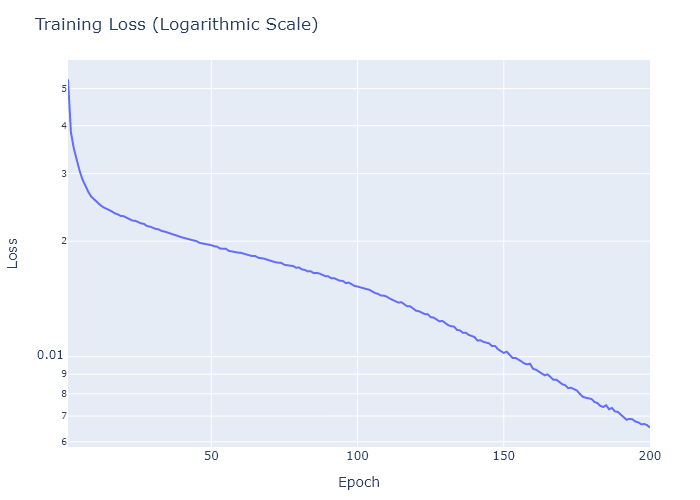

Training loss = 0.006529057102667803
Test error =0.014373423350863916
τ_exc = 3.3390869620529755, ωd = 1.2343261396610923, τ_SWAP = 31.666263735034732
Prediction error = infidelity(optimal_state, target) = 0.052205500795216464
<n> on optimal state = 0.9014134050812003
Dataset generation


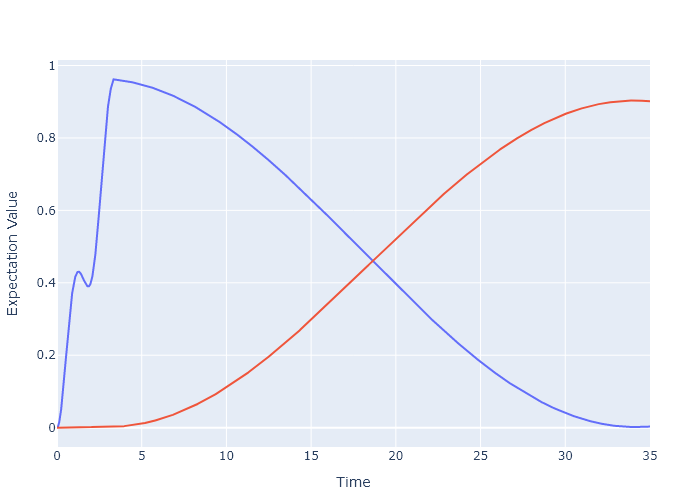

Progress: 100%|█████████████████████████████████████████| Time: 0:00:15

Progress of the training



Progress: 100%|█████████████████████████████████████████| Time: 0:19:14


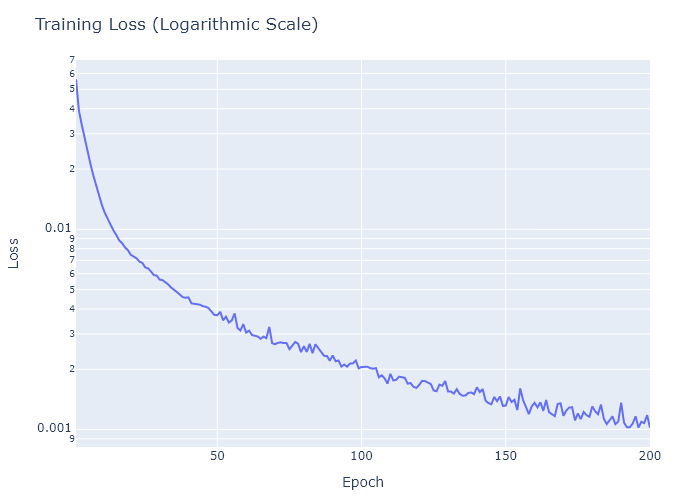

Training loss = 0.0010225088469918355
Test error =0.0025499040867756366
τ_exc = 3.1615637476989615, ωd = 0.9818064826059564, τ_SWAP = 22.420797183192597
Prediction error = infidelity(optimal_state, target) = 0.11864091152502665
<n> on optimal state = 1.6572149268772758
Dataset generation

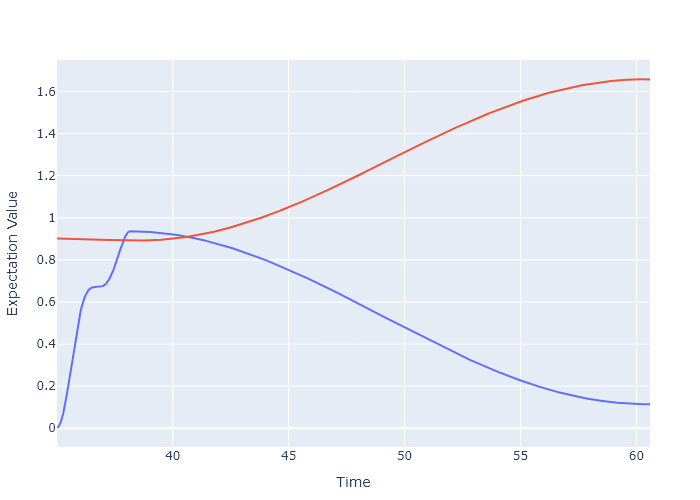

Progress:   0%|█                                        |  ETA: 0:08:01

Progress: 100%|█████████████████████████████████████████| Time: 0:00:16


Progress of the training

Progress:   1%|█                                        |  ETA: 0:03:46

Progress: 100%|█████████████████████████████████████████| Time: 0:18:46

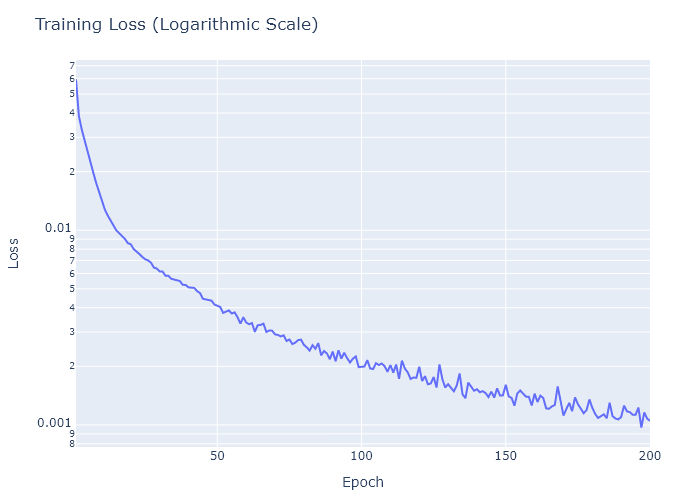

Training loss = 0.0010503552604411485
Test error =0.0023825895451263703


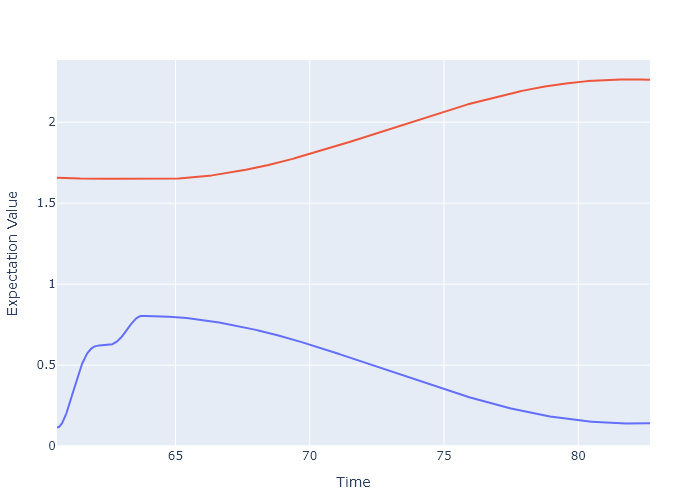

τ_exc = 3.141622457285283, ωd = 0.983566722451835, τ_SWAP = 18.94246910711978
Prediction error = infidelity(optimal_state, target) = 0.2131951212344183
<n> on optimal state = 2.2614516192719885
Dataset generation

Progress:   0%|█                                        |  ETA: 0:05:40

Progress: 100%|█████████████████████████████████████████| Time: 0:00:15


Progress of the training

Progress:   1%|█                                        |  ETA: 0:03:42

Progress: 100%|█████████████████████████████████████████| Time: 0:18:44


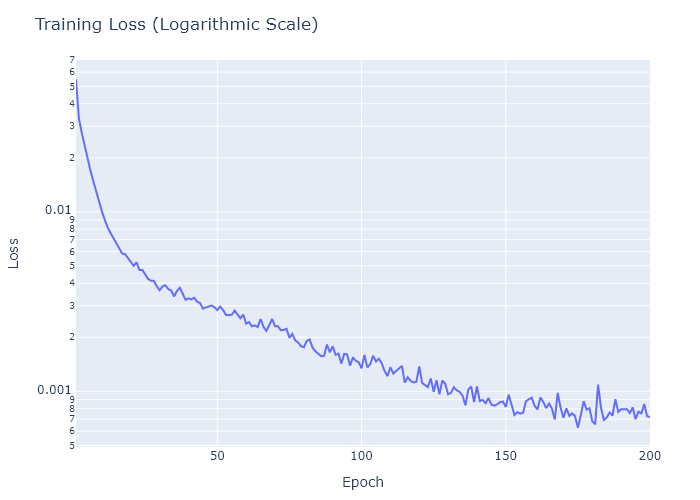

Training loss = 0.0007193371906158778
Test error =0.0015956754439618592
τ_exc = 3.1901210491216485, ωd = 0.9891813623661954, τ_SWAP = 15.823532693706548
Prediction error = infidelity(optimal_state, target) = 0.26542180620402545
<n> on optimal state = 2.845193533590445


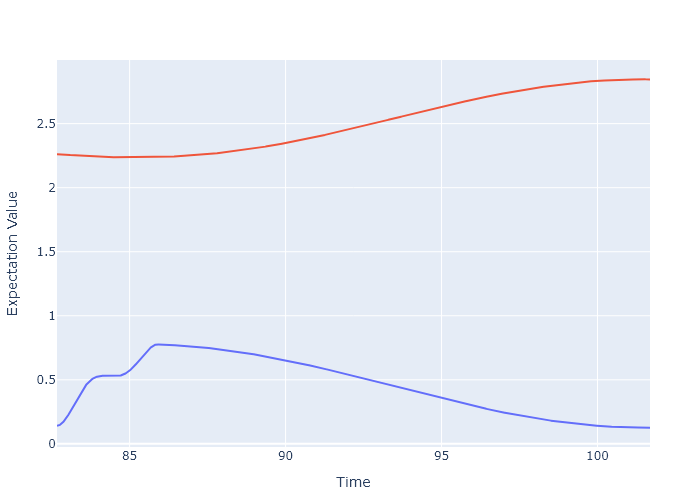

In [ ]:
N_steps = 2
# Set seed for reproducibility
Random.seed!(42)

type_of_problem = :FL_1step_3p
type_of_dynamics = :master_dynamic

function execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    infidelities = []
    predictions = []
    models = []
    final_states = []


    n_pulses = 2 #for each step
    n_input, n_output = (dimension^2) + n_pulses, n_pulses + 1

    type_of_correction = :correction_off
    norm_dataset = :normalized

    #= Dynamic features and initial conditions =#
    t0 = 0.0
    ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))
    ρ0 = ψ0 ⊗ dagger(ψ0)
    n_phonon = 0
    
    #= dimension of training+testing dataset =#
    n_samples = 300
    n_training = 275


    #= probability distribution for sampling parameters space =#
    dim_x, dim_y, dim_z = 1e3, 1e2, 1e3
    prs(x,y,z) = 1 / (dim_x * dim_y * dim_z)

    for step in 1:N_steps

        #= Physical parameters =#
        T_exc_ini, T_exc_fin = π, 1e-1 * Δ0

        δ0 = 1; δ = 100 / Δ0
        δ0_ini, δ0_fin = δ0 -δ , δ0+δ;

        t_swap_th = (π) / (2*g*sqrt(step)); δ1 = 0.0005 * Δ0 / sqrt(step); δ2 = 0.005 * Δ0;
        T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2;


        #= Features (see definitions.jl for further information) =#
        Step_states = creation_step_states(
            ρ0,
            step
        )

        FL_1step_features = fl_1step_features(
            Step_states.ρ_target_spinflip,
            Step_states.ρ_target_1step, 
            SUN_basis, 
            n_phonon, 
            type_of_correction
        )


        Dataset_features = dataset_features(
            type_of_problem, 
            [n_samples, n_training],
            [n_input, n_output], 
            [dim_x, dim_y, dim_z], 
            [[T_exc_ini, T_exc_fin], [δ0_ini, δ0_fin], [T_SWAP_ini, T_SWAP_fin]], 
            prs,  
            type_of_dynamics, 
            t0, 
            Step_states.ρ0,
            FL_1step_features,
            ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
            :generating,
            norm_dataset
        )

        ###############################################################################
        #= NN =#

        #= Main features =#
        η = 0.0001
        N_epochs = 200

        #= Model_input =#
        # Define neural network model
        model = Flux.f64(
            Flux.Chain(
            Flux.Dense(n_input, 500, relu),
            Flux.Dense(500, n_output),
            Flux.softplus
            )
        )

        target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
        NN_features = fl_1step_nn_features_(
            model,
            N_epochs,
            η,
            Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
            target_input_1step,
            [Dataset_features.t0, Step_states.ρ0, target_input_1step, Step_states.ρ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
            :mse,
            :prediction_infidelity
        )

        #= EXECUTE ALGORITHM =#
        dataset_vector, time, final_state, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);


        #= Updating initial conditions =#
        t0, ρ0, n_phonon = t0 + (time[1] + time[3]), final_state, step


        push!(infidelities, infidelity_prediction)
        push!(predictions, time)
        push!(models, model)
        push!(final_states, final_state)
    end
    
    return SUN_basis, infidelities, predictions, models, final_states
end

data_non_unitary = []
r = [0.1, 0.5]
g = 258 #KHz

for rs in r
    global Δ0 = g/rs
    include("HBAR-qubit_problem.jl")

    basis_spline = generate_Bspline_basis(degree_spline, n_basis_spline, domain_spline);

    data1, data2, data3, data4, data5 = execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    push!(data_non_unitary, [rs, data1, data2, data3, data4, data5])

end

________________

# $$ \dfrac{g}{\Delta_0} = 0.5$$

In [ ]:
r = 0.5
g = 258 #KHz
global Δ0 = g/r

include("HBAR-qubit_problem.jl")

basis_spline = generate_Bspline_basis(degree_spline, n_basis_spline, domain_spline);

# Unitary

In [ ]:
N_steps = 6
# Set seed for reproducibility
Random.seed!(42)

type_of_problem = :FL_1step_3p
type_of_dynamics = :schroedinger_dynamic

function execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    infidelities = []
    predictions = []
    models = []
    final_states = []


    n_pulses = 2 #for each step
    n_input, n_output = (dimension^2) + n_pulses, n_pulses + 1

    type_of_correction = :correction_off
    norm_dataset = :normalized

    #= Dynamic features and initial conditions =#
    t0 = 0.0
    ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))
    n_phonon = 0
    
    #= dimension of training+testing dataset =#
    n_samples = 100
    n_training = 95


    #= probability distribution for sampling parameters space =#
    dim_x, dim_y, dim_z = 1e3, 1e2, 1e3
    prs(x,y,z) = 1 / (dim_x * dim_y * dim_z)

    for step in 1:N_steps

        #= Physical parameters =#
        T_exc_ini, T_exc_fin = π, 1e-2 * Δ0

        δ0 = 1; δ = 100 / Δ0
        δ0_ini, δ0_fin = δ0 -δ , δ0+δ;

        t_swap_th = (π) / (2*g*sqrt(step)); δ1 = 0.0005 * Δ0; δ2 = 0.00015 * Δ0;
        T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2;


        #= Features (see definitions.jl for further information) =#
        Step_states = creation_step_states(
            ψ0,
            step
        )

        FL_1step_features = fl_1step_features(
            Step_states.ψ_target_spinflip,
            Step_states.ψ_target_1step, 
            SUN_basis, 
            n_phonon, 
            type_of_correction
        )


        Dataset_features = dataset_features(
            type_of_problem, 
            [n_samples, n_training],
            [n_input, n_output], 
            [dim_x, dim_y, dim_z], 
            [[T_exc_ini, T_exc_fin], [δ0_ini, δ0_fin], [T_SWAP_ini, T_SWAP_fin]], 
            prs,  
            type_of_dynamics, 
            t0, 
            Step_states.ψ0,
            FL_1step_features,
            ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
            :generating,
            norm_dataset
        )

        ###############################################################################
        #= NN =#

        #= Main features =#
        η = 0.0001
        N_epochs = 80


        #= Model_input =#
        # Define neural network model
        model = Flux.f64(
            Flux.Chain(
            Flux.Dense(n_input, 500, relu),
            Flux.Dense(500, n_output),
            Flux.softplus
            )
        )

        target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
        NN_features = fl_1step_nn_features_(
            model,
            N_epochs,
            η,
            Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
            target_input_1step,
            [Dataset_features.t0, Step_states.ψ0, target_input_1step, Step_states.ψ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
            :mse,
            :prediction_infidelity
        )

        #= EXECUTE ALGORITHM =#
        dataset_vector, time, final_state, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);


        #= Updating initial conditions =#
        t0, ψ0, n_phonon = t0 + (time[1] + time[3]), final_state, step



        push!(infidelities, infidelity_prediction)
        push!(predictions, time)
        push!(models, model)
        push!(final_states, final_state)
    end
    
    return SUN_basis, infidelities, predictions, models, final_states
end

data13, data23, data33, data43, data53 = execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps);

# Non-Unitary

In [ ]:
N_steps = 6
# Set seed for reproducibility
Random.seed!(42)

type_of_problem = :FL_1step_3p
type_of_dynamics = :master_dynamic

function execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    infidelities = []
    predictions = []
    models = []
    final_states = []


    n_pulses = 2 #for each step
    n_input, n_output = (dimension^2) + n_pulses, n_pulses + 1

    type_of_correction = :correction_off
    norm_dataset = :normalized

    #= Dynamic features and initial conditions =#
    t0 = 0.0
    ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))
    ρ0 = ψ0 ⊗ dagger(ψ0)
    n_phonon = 0
    
    #= dimension of training+testing dataset =#
    n_samples = 150
    n_training = 140


    #= probability distribution for sampling parameters space =#
    dim_x, dim_y, dim_z = 1e3, 1e2, 1e3
    prs(x,y,z) = 1 / (dim_x * dim_y * dim_z)

    for step in 1:N_steps



        #= Physical parameters =#
        T_exc_ini, T_exc_fin = π, 1e-2 * Δ0

        δ0 = 1; δ = 100 / Δ0
        δ0_ini, δ0_fin = δ0 -δ , δ0+δ;

        t_swap_th = (π) / (2*g*sqrt(step)); δ1 = 0.0005 * Δ0; δ2 = 0.00015 * Δ0;
        T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2;


        #= Features (see definitions.jl for further information) =#
        Step_states = creation_step_states(
            ρ0,
            step
        )

        FL_1step_features = fl_1step_features(
            Step_states.ρ_target_spinflip,
            Step_states.ρ_target_1step, 
            SUN_basis, 
            n_phonon, 
            type_of_correction
        )


        Dataset_features = dataset_features(
            type_of_problem, 
            [n_samples, n_training],
            [n_input, n_output], 
            [dim_x, dim_y, dim_z], 
            [[T_exc_ini, T_exc_fin], [δ0_ini, δ0_fin], [T_SWAP_ini, T_SWAP_fin]], 
            prs,  
            type_of_dynamics, 
            t0, 
            Step_states.ρ0,
            FL_1step_features,
            ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
            :generating,
            norm_dataset
        )

        ###############################################################################
        #= NN =#

        #= Main features =#
        η = 0.0001
        N_epochs = 90

        #= Model_input =#
        # Define neural network model
        model = Flux.f64(
            Flux.Chain(
            Flux.Dense(n_input, 500, relu),
            Flux.Dense(500, n_output),
            Flux.softplus
            )
        )

        target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
        NN_features = fl_1step_nn_features_(
            model,
            N_epochs,
            η,
            Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
            target_input_1step,
            [Dataset_features.t0, Step_states.ρ0, target_input_1step, Step_states.ρ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
            :mse,
            :prediction_infidelity
        )

        #= EXECUTE ALGORITHM =#
        dataset_vector, time, final_state, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);


        #= Updating initial conditions =#
        t0, ρ0, n_phonon = t0 + (time[1] + time[3]), final_state, step


        push!(infidelities, infidelity_prediction)
        push!(predictions, time)
        push!(models, model)
        push!(final_states, final_state)
    end
    
    return SUN_basis, infidelities, predictions, models, final_states
end

data14, data24, data34, data44, data54 = execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps);

___________

#### Francesco's idea:
1. Chu's protocol works well when $g \ll \Delta = \omega_q - \omega_m$ (weakly-interacting regime) -> Idea is to simulate Chu's protocol and show good infidelities;

2. As soon $g\simeq\Delta$ or $g\gg\Delta$ (strongly-interacting regime), Chu's protocol should become inefficient to produce the FL -> here, we can improve Chu's protocol, by using a NN approach to predict the optimal pulse durations (ideally, we should get smaller infidelities than Chu's ones)


#### What to do:
1. Simulate Chu's protocol with (weakly-interacting regime) and without (strongly-interacting regime) correction, and show the infidelities;

2. Predict the best pulse duration through the NN method with and without correction, and compare the obtained infidelities with Chu's ones (should be lower in the first case, larger in the second case)

3. The critical parameters affecting the working regime are $g$, $\Delta = \omega_q - \omega_m$.

In [2]:
################################################
  #= PRELIMINARY DEFINITIONS AND DYNAMICS =#
################################################
N_mech = 15; #Cut-off Fock basis for the mech resonator
dimension = 2 * (N_mech+1); #Ket state vector's dimension

#####################################################################################
#BSpline definition
degree_spline = 3            # spline order (cubic spline)
n_basis_spline = 5         # number of basis functions
domain_spline = (0.0, 1.0)  # interval for the spline
#####################################################################################

(0.0, 1.0)

In [ ]:
using Revise
include("definitions.jl")

In [4]:
include("HBAR-qubit_problem.jl")
include("ML_QM_library.jl")

basis_spline = generate_Bspline_basis(degree_spline, n_basis_spline, domain_spline)

5-element BSplineBasis of order 3, domain [0.0, 1.0]
 knots: [0.0, 0.0, 0.0, 0.333333, 0.666667, 1.0, 1.0, 1.0]

# Simulating Chu's protocol (weakly interacting regime and no correction)

In [5]:
N_steps = 10

G = [10, 100, 1000]
steps = collect(1:N_steps)
infidelities_nocorr = []
fig_data = AbstractTrace[]

layout = PlotlyJS.Layout(
    title="Infidelities without correction",
    xaxis= "s",
    yaxis= "F[s]",
    showlegend=true
)

#= Loading personal libraries =#
include("HBAR-qubit_problem.jl")
include("ML_QM_library.jl")

for interaction in G
    global g = interaction  
    initial_state = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))

    ΩR = 2e2
    pulse_parameters = [[π / ΩR, π / (2g*sqrt(n))] for n in 1:N_steps]
    type_of_dynamics = :schroedinger_dynamic
    target_states = [tensor(spindown(qub.basis),fockstate(mech_res.basis, n)) for n in 1:N_steps]
    type_of_correction = :correction_off

    chu_protocol_features1 = fl_1step_features(
        [0.0],
        target_states, 
        [0], 
        0, 
        type_of_correction
    )

    #= Too heavy
    data1, data2, plt, infidelities2 = n_steps_FL_plot(
        initial_state, 
        pulse_parameters,
        type_of_dynamics,
        chu_protocol_features1
    )    
    =#

    time_final, solution_final, infidelities_ = dynamics_n_steps_FL(N_steps, 
        initial_state,
        pulse_parameters, 
        type_of_dynamics, 
        chu_protocol_features1
    );

    #=
    println("Chu's protocol at weakly-interacting regime and no correction")
    println("Step  |        Infidelity")
    for step in 1:N_steps
        println("$step     |  ", infidelities_wi_nocorr[step])
    end
    =#
    trace = PlotlyJS.scatter(x=steps, y=infidelities_, mode = "lines", name="$g")
    push!(fig_data, trace)
    push!(infidelities_nocorr, infidelities_)

end

fig = PlotlyJS.Plot(fig_data, layout)
PlotlyJS.display(fig)

save_vector_to_csv(infidelities_nocorr[1], "Chu_nocorr_infidelity_g=1e1.csv")
save_vector_to_csv(infidelities_nocorr[2], "Chu_nocorr_infidelity_g=1e2.csv")
save_vector_to_csv(infidelities_nocorr[3], "Chu_nocorr_infidelity_g=1e3.csv")


println("Chu's protocol at weakly-interacting regime and no correction")
println("Step  |        Infidelity g = 10         g = 100           g = 1000")
for step in 1:N_steps
    println("$step     |  ", infidelities_nocorr[1][step], " | ",  infidelities_nocorr[2][step], " | ",  infidelities_nocorr[3][step])
end

Progress: 100%|█████████████████████████████████████████| Time: 0:00:28
Progress: 100%|█████████████████████████████████████████| Time: 0:00:02
Progress: 100%|█████████████████████████████████████████| Time: 0:00:02


data: [
  "scatter with fields mode, name, type, x, and y",
  "scatter with fields mode, name, type, x, and y",
  "scatter with fields mode, name, type, x, and y"
]

layout: "layout with fields margin, showlegend, template, title, xaxis, and yaxis"

Chu's protocol at weakly-interacting regime and no correction
Step  |        Infidelity g = 10         g = 100           g = 1000
1     |  4.840420962715086e-6 | 1.978928223000942e-5 | 0.0499394923418337
2     |  1.0293832392371804e-5 | 0.00013973048692939027 | 0.4288135408759479
3     |  4.575480013335742e-5 | 0.00043459852075811156 | 0.9321647549375109
4     |  6.0318189169628056e-5 | 0.0011866971181803132 | 0.9838249777489904
5     |  7.681842378515213e-5 | 0.0018536748459700991 | 0.9952150655708987
6     |  8.472219592092767e-5 | 0.003035020405855904 | 0.9992212292440295
7     |  0.0001381215687609183 | 0.004806020910842701 | 0.9999450237564788
8     |  0.00014460717943742818 | 0.0069094739581766484 | 0.9999949105616897
9     |  0.000192630213363576 | 0.009314461199113167 | 0.9999991281368078
10     |  0.0002079205615670432 | 0.012279998679900483 | 0.9999999786044431


## Simulating Chu's protocol (weakly-interacting regime with correction)

In [6]:
N_steps = 10

G = [10, 100, 1000]
steps = collect(1:N_steps)
infidelities_corr = []
fig_data = AbstractTrace[]

layout = PlotlyJS.Layout(
    title="Infidelities without correction",
    xaxis= "s",
    yaxis= "F[s]",
    showlegend=true
)

#= Loading personal libraries =#
    include("HBAR-qubit_problem.jl")
    include("ML_QM_library.jl")
for interaction in G
    global g = interaction  
    initial_state = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))

    ΩR = 2e2
    pulse_parameters = [[π / ΩR, π / (2g*sqrt(n))] for n in 1:N_steps]
    type_of_dynamics = :schroedinger_dynamic
    target_states = [tensor(spindown(qub.basis),fockstate(mech_res.basis, n)) for n in 1:N_steps]
    type_of_correction = :correction_on

    chu_protocol_features1 = fl_1step_features(
        [0.0],
        target_states, 
        [0], 
        0, 
        type_of_correction
    )

    #= Too heavy
    data1, data2, plt, infidelities2 = n_steps_FL_plot(
        initial_state, 
        pulse_parameters,
        type_of_dynamics,
        chu_protocol_features1
    )    
    =#

    time_final, solution_final, infidelities_ = dynamics_n_steps_FL(N_steps, 
        initial_state,
        pulse_parameters, 
        type_of_dynamics, 
        chu_protocol_features1
    );

    #=
    println("Chu's protocol at weakly-interacting regime and no correction")
    println("Step  |        Infidelity")
    for step in 1:N_steps
        println("$step     |  ", infidelities_wi_nocorr[step])
    end
    =#
    trace = PlotlyJS.scatter(x=steps, y=infidelities_, mode = "lines", name="$g")
    push!(fig_data, trace)
    push!(infidelities_corr, infidelities_)

end

fig = PlotlyJS.Plot(fig_data, layout)
PlotlyJS.display(fig)

save_vector_to_csv(infidelities_corr[1], "Chu_corr_infidelity_g=1e1.csv")
save_vector_to_csv(infidelities_corr[2], "Chu_corr_infidelity_g=1e2.csv")
save_vector_to_csv(infidelities_corr[3], "Chu_corr_infidelity_g=1e3.csv")


println("Chu's protocol at weakly-interacting regime and no correction")
println("Step  |        Infidelity g = 10         g = 100           g = 1000")
for step in 1:N_steps
    println("$step     |  ", infidelities_corr[1][step], " | ",  infidelities_corr[2][step], " | ",  infidelities_corr[3][step])
end

Progress: 100%|█████████████████████████████████████████| Time: 0:00:13
Progress: 100%|█████████████████████████████████████████| Time: 0:00:02
Progress: 100%|█████████████████████████████████████████| Time: 0:00:02

data: [
  "scatter with fields mode, name, type, x, and y",
  "scatter with fields mode, name, type, x, and y",
  "scatter with fields mode, name, type, x, and y"
]

layout: "layout with fields margin, showlegend, template, title, xaxis, and yaxis"

Chu's protocol at weakly-interacting regime and no correction
Step  |        Infidelity g = 10         g = 100           g = 1000
1     |  4.8403193492196905e-6 | 1.974750379862833e-5 | 0.05107395752952759
2     |  1.0307906721851445e-5 | 0.0001398436418971194 | 0.4193038618602687
3     |  4.514271189792751e-5 | 0.00041002851885763025 | 0.9214590007282778
4     |  5.857716990964601e-5 | 0.0011390715273181806 | 0.9830384034952888
5     |  7.330008203954019e-5 | 0.0018792067331251383 | 0.9947210202621807
6     |  8.112010497662858e-5 | 0.0032354733010774295 | 0.9987650451918194
7     |  0.00013337950797243092 | 0.004468876893702789 | 0.9999703334254941
8     |  0.00013919313791777022 | 0.006049472214216256 | 0.9999973776342015
9     |  0.00019181058803852125 | 0.007983640342760334 | 0.999999584237011
10     |  0.0002026019628884601 | 0.011112985495522198 | 0.9999999433315492


_____________________________________________________________

Which parameter can be controlled, $\omega_q$, $g$ or both?
1. g can be detuned, but difficult to control;
2. $\omega_m$ is hardly fixed;
3. $\omega_q$ can be controlled (flux-tunable SQUID ?).


# NN Fock ladder (g = 258)

In [5]:
################################################
  #= PRELIMINARY DEFINITIONS AND DYNAMICS =#
################################################
N_mech = 9; #Cut-off Fock basis for the mech resonator
dimension = 2 * (N_mech+1); #Ket state vector's dimension

#####################################################################################
#BSpline definition
degree_spline = 3            # spline order (cubic spline)
n_basis_spline = 5         # number of basis functions
domain_spline = (0.0, 1.0);  # interval for the spline
#####################################################################################

(0.0, 1.0)

In [6]:
using Revise
include("definitions.jl")

LoadError: LoadError: invalid redefinition of type ho
in expression starting at c:\Users\dadda\OneDrive - USN\Fock ladder\July_2025\definitions.jl:20

In [7]:
include("HBAR-qubit_problem.jl")
include("ML_QM_library.jl")

basis_spline = generate_Bspline_basis(degree_spline, n_basis_spline, domain_spline);

In [8]:
SUN_basis = rand_hermitian_orthonormal_basis(dimension, basis);

# Execution function for DFL

In [ ]:
N_steps = 1
# Set seed for reproducibility
Random.seed!(42)

function execution_dynamic_FL(N_steps)
    infidelities = []
    predictions = []
    models = []
    final_states = []


    n_pulses = 2 #for each step
    n_input, n_output = (dimension^2) + n_pulses, n_pulses

    type_of_problem = :FL_1step
    type_of_dynamics = :schroedinger_dynamic
    type_of_correction = :correction_off
    norm_dataset = :normalized

    #= Dynamic features and initial conditions =#
    t0 = 0.0
    ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))
    n_phonon = 0
    
    #= dimension of training+testing dataset =#
    n_samples = 500
    n_training = 480

    #= Physical parameters =#
    T_exc_ini, T_exc_fin = 1e-5, 5e-2

    t_swap_th = π / (2*g); δ1 = 0.0005; δ2 = 0.00015
    T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2


    #= probability distribution for sampling parameters space =#
    dim_x, dim_y = 5e3, 5e3
    prs(x,y) = 1 / (dim_x * dim_y)

    for step in 1:N_steps
        #= Features (see definitions.jl for further information) =#
        Step_states = creation_step_states(
            ψ0,
            step
        )

        FL_1step_features = fl_1step_features(
            Step_states.ψ_target_spinflip,
            Step_states.ψ_target_1step, 
            SUN_basis, 
            n_phonon, 
            type_of_correction
        )


        Dataset_features = dataset_features(
            type_of_problem, 
            [n_samples, n_training],
            [n_input, n_output], 
            [dim_x, dim_y], 
            [[T_exc_ini, T_exc_fin], [T_SWAP_ini, T_SWAP_fin]], 
            prs,  
            type_of_dynamics, 
            t0, 
            Step_states.ψ0,
            FL_1step_features,
            ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
            :generating,
            norm_dataset
        )

        ###############################################################################
        #= NN =#

        #= Main features =#
        η = 0.0001
        N_epochs = 250

        #= Model_input =#
        # Define neural network model
        model = Flux.f64(
            Flux.Chain(
            Flux.Dense(n_input, 500, relu),
            Flux.Dense(500, n_output),
            Flux.softplus
            )
        )

        target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
        NN_features = fl_1step_nn_features_(
            model,
            N_epochs,
            η,
            Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
            target_input_1step,
            [Dataset_features.t0, Step_states.ψ0, target_input_1step, Step_states.ψ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
            :mse,
            :prediction_infidelity
        )

        #= EXECUTE ALGORITHM =#
        dataset_vector, time, final_state, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);


        #= Updating initial conditions =#
        t0, ψ0, n_phonon = t0 + sum(time), final_state, step


        push!(infidelities, infidelity_prediction)
        push!(predictions, time)
        push!(models, model)
        push!(final_states, final_state)
    end
    
    return SUN_basis, infidelities, predictions, models, final_states
end

data1, data2, data3, data4, data5 = execution_dynamic_FL(N_steps)

Dataset generation


Progress: 100%|█████████████████████████████████████████| Time: 0:04:07


Progress of the training


Progress:  10%|█████                                    |  ETA: 0:16:40

In [7]:
DFL_infidelities = load_vector_from_csv("DFL_infidelities_g1e3.csv")
println("Weakly-interacting regime and no correction for g = 1e3 / comparison DFL and Chu's protocol")
println("Step  |     DFL   Infidelity  | Chu's infidelity " )
for step in 1:6
    println("$step     |  ", DFL_infidelities[step], " | ",  infidelities_nocorr[3][step])
end

Weakly-interacting regime and no correction for g = 1e3 / comparison DFL and Chu's protocol
Step  |     DFL   Infidelity  | Chu's infidelity 
1     |  0.003991669284501453 | 0.0499394923418337
2     |  0.023343859056177307 | 0.4288135408759479
3     |  0.0483618505922041 | 0.9321647549375109
4     |  0.1058628604373173 | 0.9838249777489904
5     |  0.19402831244786556 | 0.9952150655708987
6     |  0.43616591402901483 | 0.9992212292440295


### As shown from the table above, the DFL performes much better than the Chu's protocol, especially at the initial steps.

______

# FOR MARIUS: execution

## From here

In [ ]:
using Pkg
Pkg.activate(".")

#=
Pkg.add(
["QuantumOptics","Flux", "ProgressMeter", "Random", 
"Statistics", "SparseArrays", "Zygote", "LinearAlgebra", 
"StatsBase","DiffEqFlux","Optimisers","Compat",
"PlotlyJS","DataFrames", "CSV","BSON", "Revise", "DelimitedFiles"]
)
=#

Pkg.instantiate()
Pkg.status()

###########################################
#= Packages =#
using Flux, ProgressMeter, Random, Statistics, QuantumOptics, SparseArrays, StatsBase, LinearAlgebra, Revise
using Zygote, DifferentialEquations, SciMLSensitivity, DiffEqFlux, Optimisers, Compat, PlotlyJS, CSV, DataFrames, BSON
using Distributions, BSplineKit, DelimitedFiles
##########################################

In [ ]:
################################################
  #= PRELIMINARY DEFINITIONS AND DYNAMICS =#
################################################
N_mech = 9; #Cut-off Fock basis for the mech resonator
dimension = 2 * (N_mech+1); #Ket state vector's dimension

#####################################################################################
#BSpline definition
degree_spline = 3            # spline order (cubic spline)
n_basis_spline = 5         # number of basis functions
domain_spline = (0.0, 1.0);  # interval for the spline
#####################################################################################

In [ ]:
using Revise
include("definitions.jl")

In [ ]:
include("HBAR-qubit_problem.jl")
include("ML_QM_library.jl")

In [ ]:
basis_spline = generate_Bspline_basis(degree_spline, n_basis_spline, domain_spline);
SUN_basis = rand_hermitian_orthonormal_basis(dimension, basis);

## 1st step (g = 1e3)

In [74]:
#=
#global g = 1e3

n_pulses = 2 #for each step
n_input, n_output = (dimension^2) + n_pulses, n_pulses

######################################################################################
#= Dynamic features and initial conditions =#
step_number = 1

t0 = 0.0
ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))

type_of_problem = :FL_1step
type_of_dynamics = :schroedinger_dynamic
type_of_correction = :correction_off
norm_dataset = :normalized
n_phonon = 0

#= dimension of training+testing dataset =#
n_samples = 500
n_training = 480

#= Physical parameters =#
T_exc_ini, T_exc_fin = 1e-5, 5e-2

t_swap_th = π / (2*g); δ1 = 0.0015; δ2 = 0.00015
T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2


#= probability distribution for sampling parameters space =#
dim_x, dim_y = 5e3, 5e3
prs(x,y) = 1 / (dim_x * dim_y)


#= Features (see definitions.jl for further information) =#
#
Step_states = creation_step_states(
    ψ0,
    step_number
)

FL_1step_features = fl_1step_features(
    Step_states.ψ_target_spinflip,
    Step_states.ψ_target_1step, 
    SUN_basis, 
    n_phonon, 
    type_of_correction
)


Dataset_features = dataset_features(
    type_of_problem, 
    [n_samples, n_training],
    [n_input, n_output], 
    [dim_x, dim_y], 
    [[T_exc_ini, T_exc_fin], [T_SWAP_ini, T_SWAP_fin]], 
    prs,  
    type_of_dynamics, #master_dynamic for dissipative dynamics
    t0, 
    Step_states.ψ0,
    FL_1step_features,
    ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
    :generating,
    norm_dataset
)

###############################################################################
#= NN =#

#= Main features =#
η = 0.0001
N_epochs = 250

#= Model_input =#
# Set seed for reproducibility
Random.seed!(42)

# Define neural network model
model = Flux.f64(
    Flux.Chain(
    Flux.Dense(n_input, 500, relu),
    Flux.Dense(500, n_output),
    Flux.softplus
    )
)

target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
NN_features = fl_1step_nn_features_(
    model,
    N_epochs,
    η,
    Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
    target_input_1step,
    [Dataset_features.t0, Step_states.ψ0, target_input_1step, Step_states.ψ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
    :mse,
    :prediction_infidelity
)


#= EXECUTE ALGORITHM =#
dataset_vector, t1, state1, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);
=#

## TO HERE

________________________________

## 2nd step

In [73]:
#=
#= Dynamic features and initial conditions =#
step_number = 2

t0 = sum(t1)
ψ0 = state1
n_phonon = 1

#= dimension of training+testing dataset =#
n_samples = 500
n_training = 480

#= Physical parameters =#
T_exc_ini, T_exc_fin = 1e-5, 5e-2

t_swap_th = π / (2*g); δ1 = 0.0015; δ2 = 0.00015
T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2


#= probability distribution for sampling parameters space =#
dim_x, dim_y = 5e3, 5e3
prs(x,y) = 1 / (dim_x * dim_y)


#= Features (see definitions.jl for further information) =#
#
Step_states = creation_step_states(
    ψ0,
    step_number
)

FL_1step_features = fl_1step_features(
    Step_states.ψ_target_spinflip,
    Step_states.ψ_target_1step, 
    SUN_basis, 
    n_phonon, 
    type_of_correction
)


Dataset_features = dataset_features(
    type_of_problem, 
    [n_samples, n_training],
    [n_input, n_output], 
    [dim_x, dim_y], 
    [[T_exc_ini, T_exc_fin], [T_SWAP_ini, T_SWAP_fin]], 
    prs,  
    type_of_dynamics, #master_dynamic for dissipative dynamics
    t0, 
    Step_states.ψ0,
    FL_1step_features,
    ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
    :generating,
    norm_dataset
)

###############################################################################
#= NN =#

#= Main features =#
η = 0.00025
N_epochs = 100

#= Model_input =#
# Set seed for reproducibility
Random.seed!(42)

# Define neural network model
model2 = Flux.f64(
    Flux.Chain(
    Flux.Dense(n_input, 150, relu),
    Flux.Dense(150, n_output),
    Flux.softplus
    )
)

target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
NN_features = fl_1step_nn_features(
    model2,
    N_epochs,
    η,
    target_input_1step,
    [Dataset_features.t0, Step_states.ψ0, target_input_1step, Step_states.ψ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
    :mse,
    :prediction_infidelity
)

opt = Flux.Optimise.setup(Flux.Optimisers.Adam(NN_features.η), NN_features.model)

#= EXECUTE ALGORITHM =#
dataset_vector2, t2, state2, infidelity_prediction2 = execute_problem_NN(Dataset_features, NN_features);
=#

______________

Progress:   1%|█                                        |  ETA: 0:00:29

Dataset generation


Progress: 100%|█████████████████████████████████████████| Time: 0:00:26


Progress of the training

Progress:   1%|█                                        |  ETA: 0:00:23

Progress: 100%|█████████████████████████████████████████| Time: 0:00:47


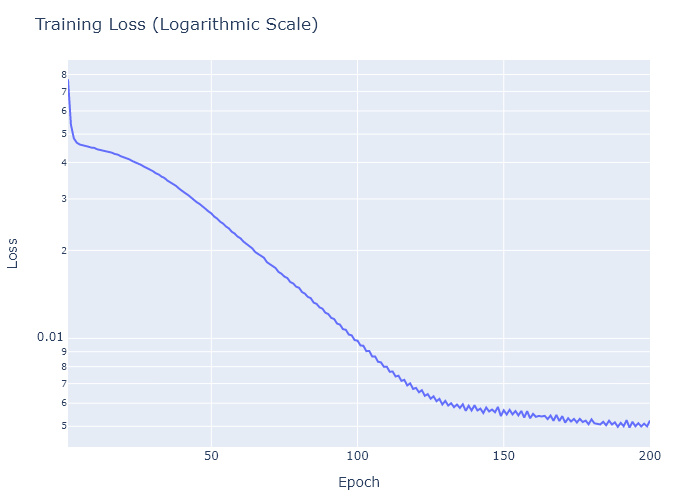

Training loss = 0.005231923359888578
Test error =0.0060360001351503585
τ_exc = 0.009831909118332677, τ_SWAP = 0.00608467640570276
Prediction error = infidelity(optimal_state, target) = 0.0002954887467691014
<n> on optimal state = 0.9994093817124104
Dataset generation


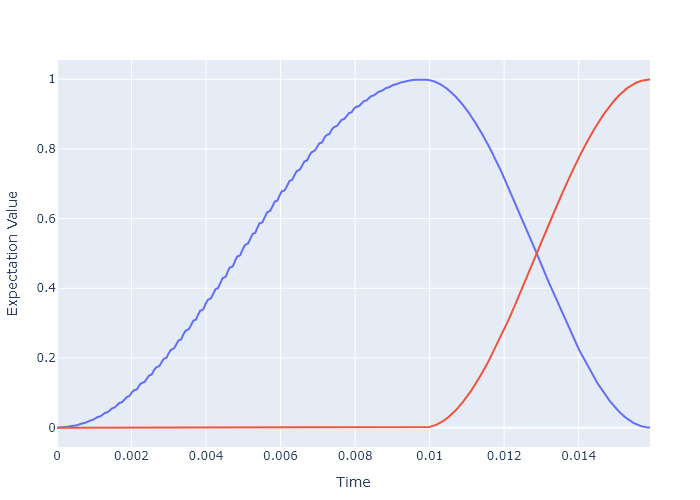

Progress: 100%|█████████████████████████████████████████| Time: 0:00:25
Progress:   1%|█                                        |  ETA: 0:00:23

Progress of the training


Progress: 100%|█████████████████████████████████████████| Time: 0:00:46


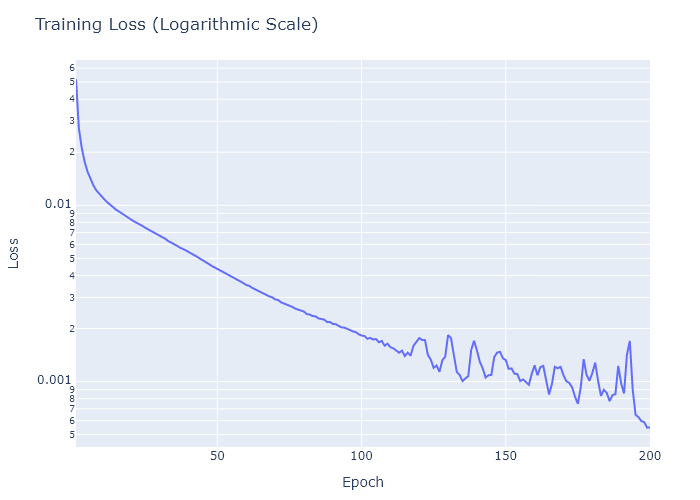

Training loss = 0.0005488298418311392
Test error =0.0009818631006862652
τ_exc = 0.006021946498818476, τ_SWAP = 0.004321913318823327
Prediction error = infidelity(optimal_state, target) = 0.001388819611269465
<n> on optimal state = 1.9950511075449584


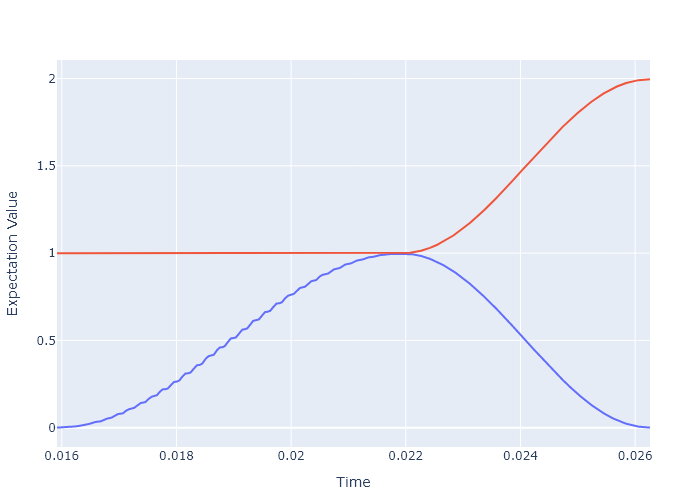

In [23]:
N_steps = 2
# Set seed for reproducibility
Random.seed!(42)

type_of_problem = :FL_1step
type_of_dynamics = :schroedinger_dynamic

function execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps)
    infidelities = []
    predictions = []
    models = []
    final_states = []


    n_pulses = 2 #for each step
    n_input, n_output = (dimension^2) + n_pulses, n_pulses

    type_of_correction = :correction_off
    norm_dataset = :normalized

    #= Dynamic features and initial conditions =#
    t0 = 0.0
    ψ0 = tensor(spindown(qub.basis),fockstate(mech_res.basis, 0))
    n_phonon = 0
    
    #= dimension of training+testing dataset =#
    n_samples = 150
    n_training = 140


    #= probability distribution for sampling parameters space =#
    dim_x, dim_y = 5e2, 5e2
    prs(x,y) = 1 / (dim_x * dim_y)

    for step in 1:N_steps

        #= Physical parameters =#
        T_exc_ini, T_exc_fin = 1e-5, 5e-2

        t_swap_th = π / (2*g*sqrt(step)); δ1 = 0.0005; δ2 = 0.00015;
        T_SWAP_ini, T_SWAP_fin = t_swap_th - δ1, t_swap_th + δ2;


        #= Features (see definitions.jl for further information) =#
        Step_states = creation_step_states(
            ψ0,
            step
        )

        FL_1step_features = fl_1step_features(
            Step_states.ψ_target_spinflip,
            Step_states.ψ_target_1step, 
            SUN_basis, 
            n_phonon, 
            type_of_correction
        )


        Dataset_features = dataset_features(
            type_of_problem, 
            [n_samples, n_training],
            [n_input, n_output], 
            [dim_x, dim_y], 
            [[T_exc_ini, T_exc_fin], [T_SWAP_ini, T_SWAP_fin]], 
            prs,  
            type_of_dynamics, 
            t0, 
            Step_states.ψ0,
            FL_1step_features,
            ["train_input_1step.csv", "train_output_1step.csv", "test_input_1step.csv", "test_output_1step.csv"],
            :generating,
            norm_dataset
        )

        ###############################################################################
        #= NN =#

        #= Main features =#
        η = 0.0001
        N_epochs = 200


        #= Model_input =#
        # Define neural network model
        model = Flux.f64(
            Flux.Chain(
            Flux.Dense(n_input, 500, relu),
            Flux.Dense(500, n_output),
            Flux.softplus
            )
        )

        target_input_1step = vcat([expectation_value(matrix, Step_states.ρ_target_1step) for matrix in SUN_basis], [0,0])
        NN_features = fl_1step_nn_features_(
            model,
            N_epochs,
            η,
            Flux.Optimise.setup(Flux.Optimisers.Adam(η), model),
            target_input_1step,
            [Dataset_features.t0, Step_states.ψ0, target_input_1step, Step_states.ψ_target_1step, Dataset_features.dynamics, Dataset_features.norm_dataset, FL_1step_features.correction, n_phonon, n_output, [[0.0,1.0],[0.0,1.0], [0.0,1.0], [0.0,1.0]]],
            :mse,
            :prediction_infidelity
        )

        #= EXECUTE ALGORITHM =#
        dataset_vector, time, final_state, infidelity_prediction = execute_problem_NN(Dataset_features, NN_features);


        #= Updating initial conditions =#
        t0, ψ0, n_phonon = t0 + (time[1] + time[2]), final_state, step



        push!(infidelities, infidelity_prediction)
        push!(predictions, time)
        push!(models, model)
        push!(final_states, final_state)
    end
    
    return SUN_basis, infidelities, predictions, models, final_states
end

data11, data21, data31, data41, data51 = execution_dynamic_FL(type_of_problem, type_of_dynamics, N_steps);